# 数据处理

## $\S1$ 基本参数配置

In [1]:
# Package Import
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configuration
## Data_Path
Path = "../Raw_Data.xlsx"
## Rename_Columns
Rename_Columns = {"开盘":"Open", "高":"High", "低":"Low", "收盘":"Close"}
## Dependent Variable
Dependent_Variable = "USD_index"
Dependent_Type = "USD_index_Close"
## Independent Variables
Exchange_Rates = ["USD_EUR", "USD_GBP", "USD_JPY", "USD_CNY"]
Exchange_Rates_Type = [f"{rate}_Open" for rate in Exchange_Rates]

Interest_Rates = ["US_10Y", "CN_10Y", "GER_10Y", "UK_10Y", "JP_10Y"]
Interest_Rates_Type = [f"{rate}_Open" for rate in Interest_Rates]

Commodity_Prices = ["GOLD", "WTI"]
Commodity_Prices_Type = [f"{price}_Open" for price in Commodity_Prices]

Market_Sentiment = ["VIX"]
Market_Sentiment_Type = [f"{senti}_Open" for senti in Market_Sentiment]

Market_Index = ["US_index", "CN_index", "GER_index", "UK_index", "JP_index"]
Market_Index_Type = [f"{market}_Open" for market in Market_Index]

## Plotting Global Setting
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["SimHei"],
    "font.size": 12,
    "axes.unicode_minus": False
})


## $\S2$ 数据读取与处理

In [2]:
# Data Loading Using Pandas
## Loading multiples sheets in a single excel
dfs = pd.read_excel(Path, sheet_name=None, index_col="日期")

# Data Processing
## Select Columns
columns = ["收盘", "开盘", "高", "低"]
Data = pd.DataFrame()
count = 0
for name, df in dfs.items():
    print(f"Processing {name}...")
    count += 1
    ### Select  Columns:
    df = df[columns].copy()
    ### Rename Columns:
    df.rename(columns=Rename_Columns, inplace=True)
    ### Rename columns with prefix of sheet name:
    df.columns = [f"{name}_{col}" for col in df.columns]
    ### Merge data into Data:
    Data = pd.concat([Data, df], axis=1, join="outer")
print(f"Total {count} sheets processed.")

### Select Columns for Research
#### Dependent_Variable and other columns like "_Open" as independent variables
Data = Data[[Dependent_Type] + [col for col in Data.columns if col.endswith("_Open") and not re.match(Dependent_Variable, col)]]

## Calculating New Columns:
### Converting USD_index into log-difference:
Data[Dependent_Type] = np.log(Data[Dependent_Type]).diff()
### Converting Exchange Rate into log-difference:
for ex_rate in Exchange_Rates:
    Data[f"{ex_rate}_Open"] = np.log(Data[f"{ex_rate}_Open"]).diff()
### Converting Commodity Prices into log-difference:
for prices in Commodity_Prices:
    Data[f"{prices}_Open"] = np.log(Data[f"{prices}_Open"]).diff()
### Converting Interests Rate by adding differences of each other:
for int_rate_a in Interest_Rates:
    for int_rate_b in Interest_Rates[Interest_Rates.index(int_rate_a)+1:]:
        Data[f"{int_rate_a}-{int_rate_b}_Open"] = Data[f"{int_rate_a}_Open"] - Data[f"{int_rate_b}_Open"]
### Converting Market Sentiment by adding difference:
for senti in Market_Sentiment:
    Data[f"{senti}_Delta"] = Data[f"{senti}_Open"].diff()
### Converting Market Index into log-difference:
for market in Market_Index:
    Data[f"{market}_Open"] = np.log(Data[f"{market}_Open"]).diff()
## Process Missing Values
Data = Data.dropna(how="any")
Data.to_excel("./Raw_Data_1.xlsx")

## Calculating Historical Volatility
Lags = [7, 28, 84]
for lag in Lags:
    Data[f"{Dependent_Type}_Past{lag}"] = Data[Dependent_Type].rolling(window=lag, closed="left").std()
## Data Output
Data = Data.dropna(how="any")
Data.to_excel("./Raw_Data_2.xlsx")


## Calculating Volatility
Data[Dependent_Type] = Data[Dependent_Type].rolling(window=30, closed="right").std()
Data[Dependent_Type] = Data[Dependent_Type].shift(-29)
Data = Data.dropna(how="any")
Data.to_excel("./Raw_Data_3.xlsx")

Processing USD_index...
Processing USD_EUR...
Processing USD_JPY...
Processing USD_GBP...
Processing USD_CNY...
Processing GOLD...
Processing WTI...
Processing US_10Y...
Processing CN_10Y...
Processing UK_10Y...
Processing JP_10Y...
Processing GER_10Y...
Processing VIX...
Processing US_index...
Processing CN_index...
Processing UK_index...
Processing JP_index...
Processing GER_index...
Total 18 sheets processed.


d:\Python_Venvs\Venv3.11\Finance_Data\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [3]:
# Data Description
Data.describe().T

,count,mean,std,min,25%,50%,75%,max
USD_index_Close,3357.0,0.004591,0.001583,0.001447,0.003538,0.004239,0.005376,0.011105
USD_EUR_Open,3357.0,-0.000056,0.005857,-0.036315,-0.003327,0.000000,0.003064,0.031372
USD_JPY_Open,3357.0,0.000008,0.005560,-0.038897,-0.002804,0.000087,0.003018,0.034333
USD_GBP_Open,3357.0,-0.000077,0.006108,-0.029838,-0.003382,-0.000159,0.003168,0.092006
USD_CNY_Open,3357.0,-0.000009,0.002002,-0.015891,-0.000756,-0.000016,0.000644,0.024448
GOLD_Open,3357.0,0.000285,0.011156,-0.090398,-0.005189,0.000553,0.006275,0.105373
WTI_Open,3357.0,-0.000441,0.024552,-0.261889,-0.012629,0.000189,0.012475,0.166946
US_10Y_Open,3357.0,2.894693,1.103149,0.512000,2.014000,2.772000,3.800000,5.289000
CN_10Y_Open,3357.0,3.331369,0.635743,1.624000,2.937000,3.340000,3.697000,4.730000
UK_10Y_Open,3357.0,2.701432,1.485779,0.077000,1.397000,2.600000,4.050000,5.576000


## $\S3$ 数据可视化

### $\S3.1$ Raw_Data3数据可视化

Data3一共有3357行, 32列.


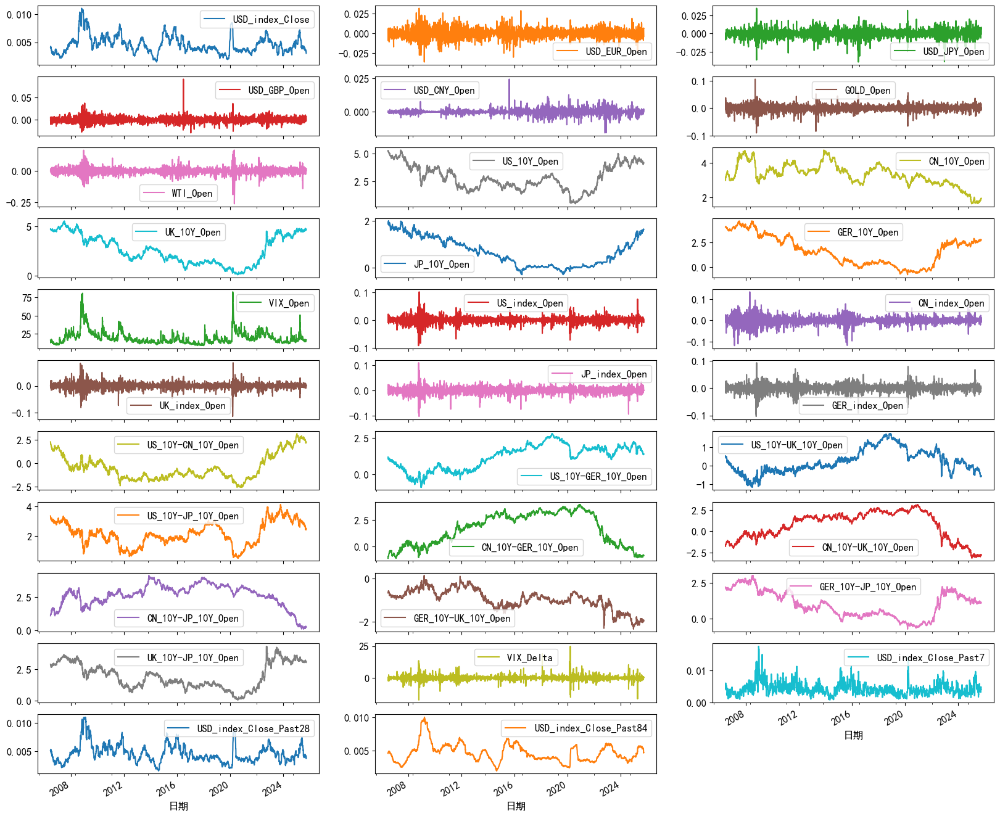

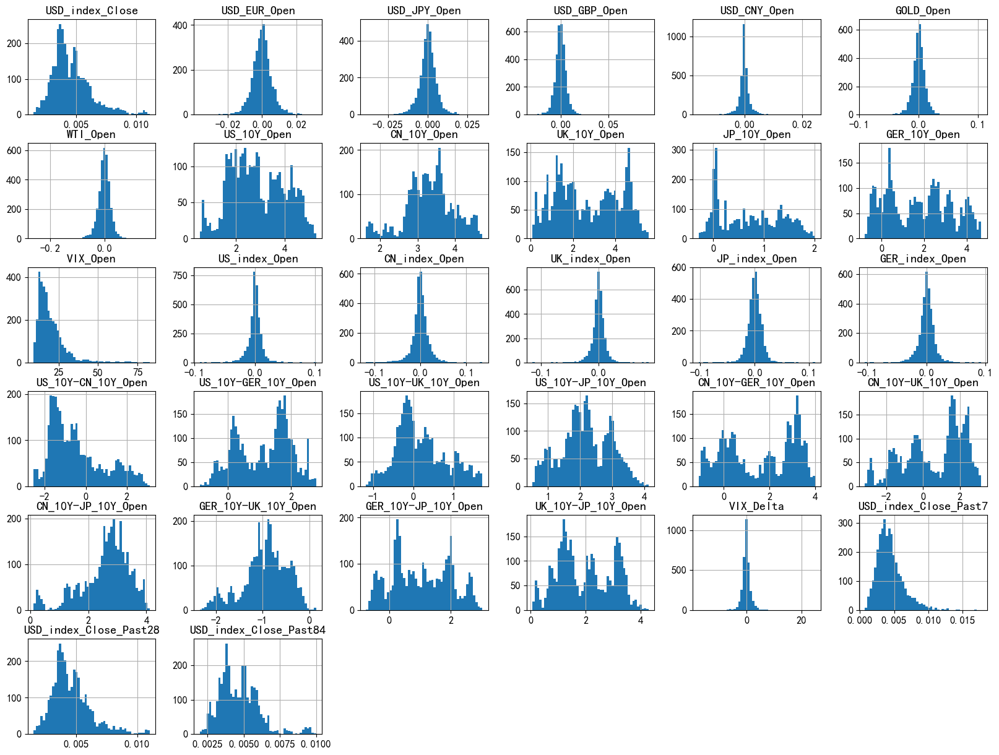

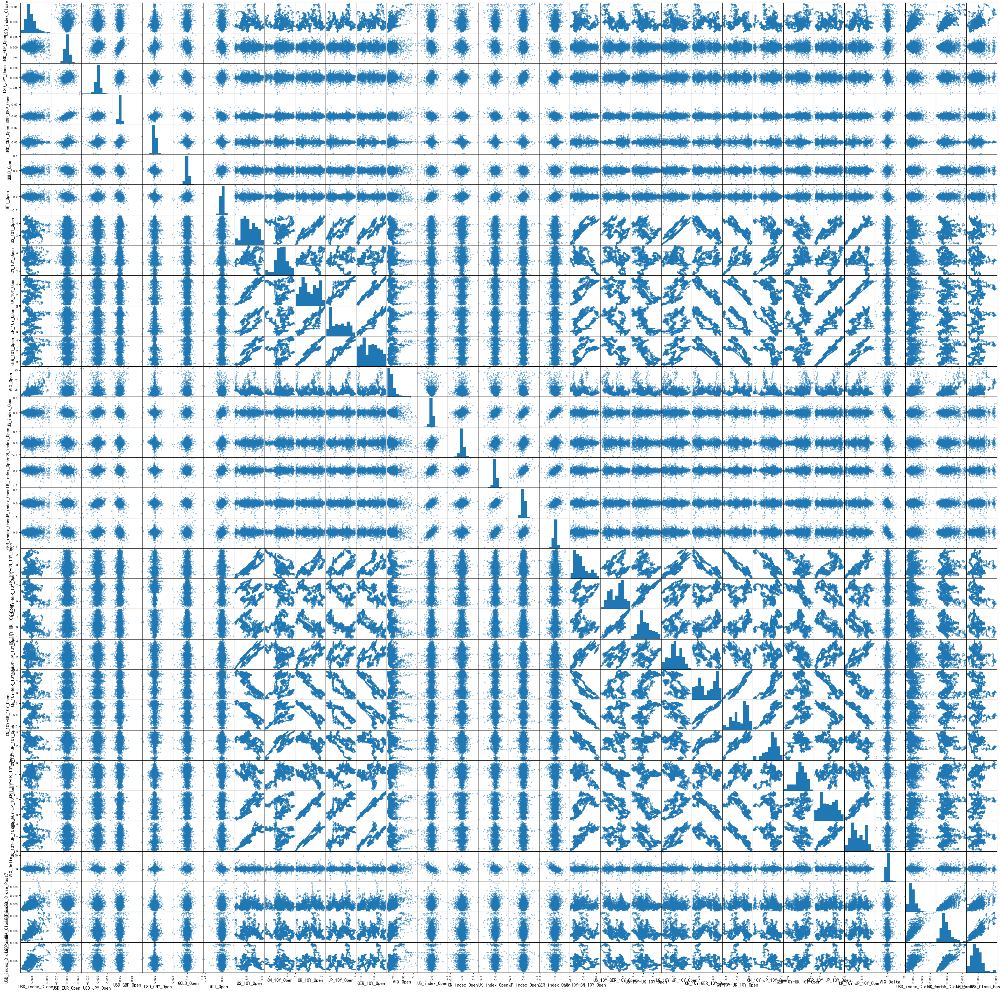

In [4]:
# Original Data Presentation:
Data3 = pd.read_excel("./Raw_Data_3.xlsx", index_col="日期")
print(f"Data3一共有{Data3.shape[0]}行, {Data3.shape[1]}列.")

## Darwing Plots:
Data3.plot(figsize=(20,20), subplots=True, layout=(12,3));
## Darwing Histograms:
Data3.hist(bins=50, figsize=(20,15));
## Drawing Scatter Matrix:
pd.plotting.scatter_matrix(Data3, figsize=(45,45));

<Axes: >

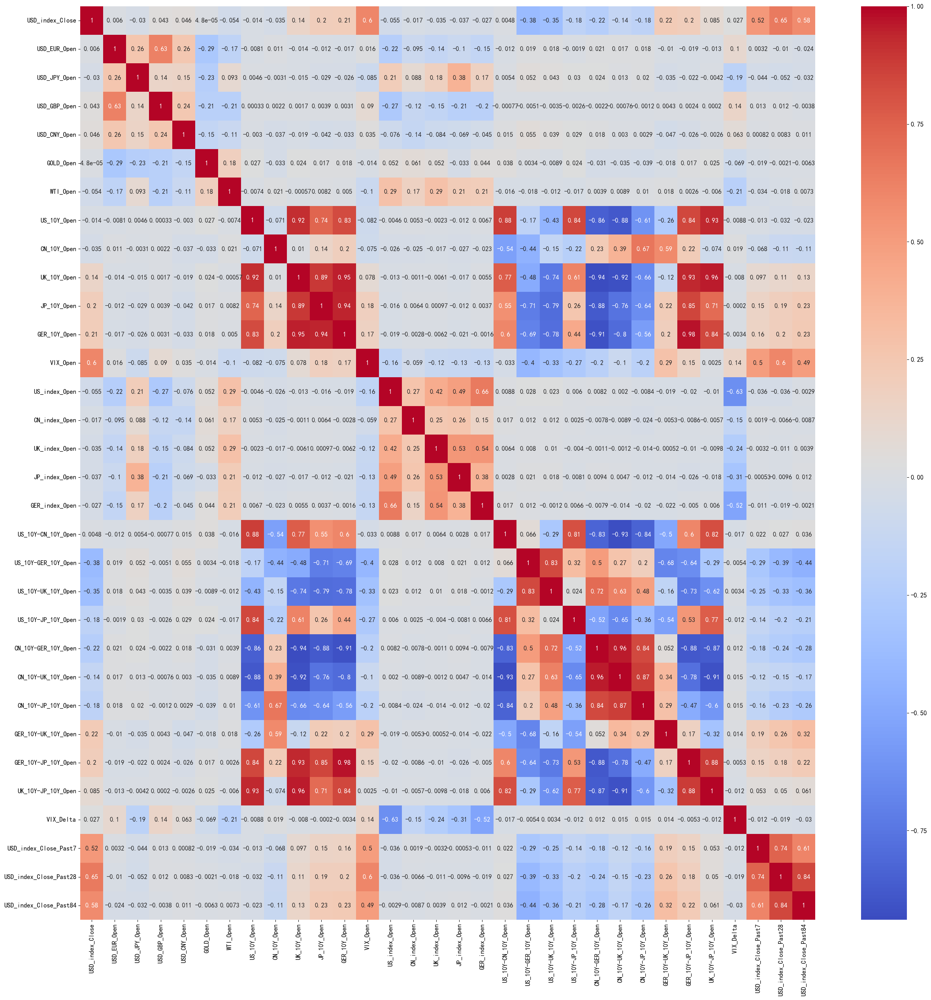

In [5]:
## Drawing Static Correlation Heatmap:
plt.figure(figsize=(30,30));
### annot可以标注数值大小
sns.heatmap(Data3.corr(), cmap="coolwarm", annot=True)